# Terms to know for Audio in Digital Form:

## Frequency (Hz)
- Frequency describes the differences of wave lengths.
- We interperate frequency has high and low pitches.

<img src="https://uploads-cdn.omnicalculator.com/images/britannica-wave-frequency.jpg" width="400"/>

## Intensity (db / power)
- Intensity describes the amplitude (height) of the wave.

<img src="https://ars.els-cdn.com/content/image/3-s2.0-B9780124722804500162-f13-15-9780124722804.gif" width="400"/>

## Sample Rate
- Sample rate is specific to how the computer reads in the audio file.
- Think of it as the "resolution" of the audio.

<img src="https://www.headphonesty.com/wp-content/uploads/2019/07/Sample-Rate-Bit-Depth-and-Bit-Rate.jpeg" width="400"/>


# Import Library

In [1]:
# Import necessary libraries for data manipulation, numerical operations and file operations
import os
import numpy as np
import pandas as pd

# Import TensorFlow and print its version
import tensorflow as tf
print(f"Tensorflow version: {tf.__version__}")

# Importing components from Keras for building a neural network model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout,Activation,Flatten
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import BinaryCrossentropy

# Importing metrics from sklearn for model evaluation
from sklearn.metrics import classification_report ,confusion_matrix , ConfusionMatrixDisplay
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import average_precision_score

# Importing librosa for audio processing, soundfile for reading and writing audio files
import librosa
import librosa.display
import soundfile as sf
from scipy.io import wavfile

# Importing seaborn for statistical data visualization and matplotlib for plotting
import seaborn as sns
import matplotlib.pyplot as plt
import IPython.display as ipd
from IPython.display import Audio
from tqdm import tqdm

Tensorflow version: 2.16.1


# Data Preprocessing

In [2]:
Ravdess = "/kaggle/input/ravdess-emotional-speech-audio/audio_speech_actors_01-24/"
Ravdess2 = "/kaggle/input/ravdess-emotional-song-audio"
Triet_data = "/kaggle/input/singing2/mp3_folder"
speaker_talk = "/kaggle/input/ted-talks-audio"
singer = "/kaggle/input/singer-vs-rapper/Samples/Singer"

In [3]:
def make_audio_df(dataset_path, label):
    """
    Creates a DataFrame with file paths and a specified target label for .wav and .mp3 files.
    
    Args:
        dataset_path (str): Path to the dataset directory.
        label (str): Label to assign to all files in the dataset (e.g., 'Talking', 'Singing').
    
    Returns:
        pd.DataFrame: A DataFrame with file paths and target labels.
    """
    # Get a list of directories in the dataset
    directory_list = os.listdir(dataset_path)

    # Initialize lists to store classification and file paths
    file_type = []
    file_path = []

    # Loop through each directory (actor folders)
    for dir in directory_list:
        dir = os.path.join(dataset_path, dir)  # Full path to the actor directory

        # Ensure it's a directory (not a file)
        if os.path.isdir(dir):
            files = os.listdir(dir)  # List all files in the actor directory
            
            for file in files:
                # Only process .mp3 and .wav files
                if file.endswith(('.mp3', '.wav')):
                    # Append the file type (label) and file path
                    file_type.append(label)
                    file_path.append(os.path.join(dir, file))

    # Create a DataFrame
    audio_df = pd.DataFrame({'Path': file_path, 'Target': file_type})
    return audio_df

In [4]:
speaker_talk_df = make_audio_df(speaker_talk, 'Talking')
speaker_talk_df.head()

,Path,Target
0,/kaggle/input/ted-talks-audio/AUDIO/3614.mp3,Talking
1,/kaggle/input/ted-talks-audio/AUDIO/21017.mp3,Talking
2,/kaggle/input/ted-talks-audio/AUDIO/2222.mp3,Talking
3,/kaggle/input/ted-talks-audio/AUDIO/1825.mp3,Talking
4,/kaggle/input/ted-talks-audio/AUDIO/62678.mp3,Talking


In [5]:
talking_df = make_audio_df(Ravdess, 'Talking')
talking_df.head()

,Path,Target
0,/kaggle/input/ravdess-emotional-speech-audio/a...,Talking
1,/kaggle/input/ravdess-emotional-speech-audio/a...,Talking
2,/kaggle/input/ravdess-emotional-speech-audio/a...,Talking
3,/kaggle/input/ravdess-emotional-speech-audio/a...,Talking
4,/kaggle/input/ravdess-emotional-speech-audio/a...,Talking


In [6]:
ravdess_song_audio = make_audio_df(Ravdess2, 'Singing')
ravdess_song_audio.head()

,Path,Target
0,/kaggle/input/ravdess-emotional-song-audio/Act...,Singing
1,/kaggle/input/ravdess-emotional-song-audio/Act...,Singing
2,/kaggle/input/ravdess-emotional-song-audio/Act...,Singing
3,/kaggle/input/ravdess-emotional-song-audio/Act...,Singing
4,/kaggle/input/ravdess-emotional-song-audio/Act...,Singing


In [7]:
Triet_data_audio = make_audio_df(Triet_data, 'Singing')
Triet_data_audio.head()

,Path,Target
0,/kaggle/input/singing2/mp3_folder/Triet data/R...,Singing
1,/kaggle/input/singing2/mp3_folder/Triet data/R...,Singing
2,/kaggle/input/singing2/mp3_folder/Triet data/R...,Singing
3,/kaggle/input/singing2/mp3_folder/Triet data/R...,Singing
4,/kaggle/input/singing2/mp3_folder/Pickleball/P...,Singing


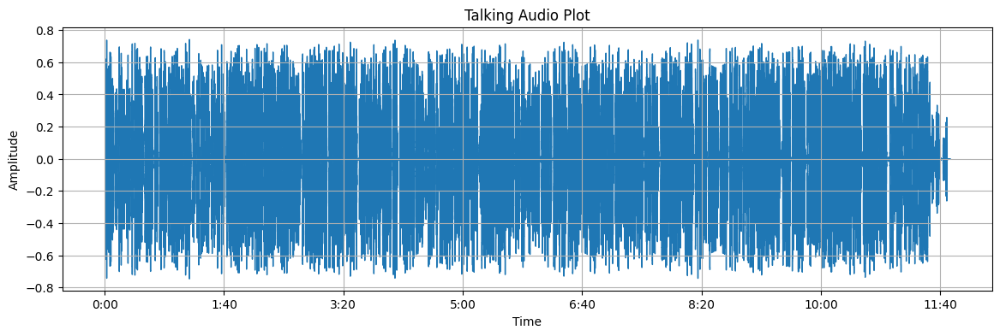

In [8]:
# Sample Audio
path = np.array(speaker_talk_df.Path)[1]
data, sample_rate = librosa.load(path)

plt.figure(figsize=(14,4))
plt.grid()
plt.title("Talking Audio Plot")
plt.ylabel("Amplitude")
librosa.display.waveshow(y=data, sr=sample_rate)
Audio(path)

In [9]:
sample_rate

22050

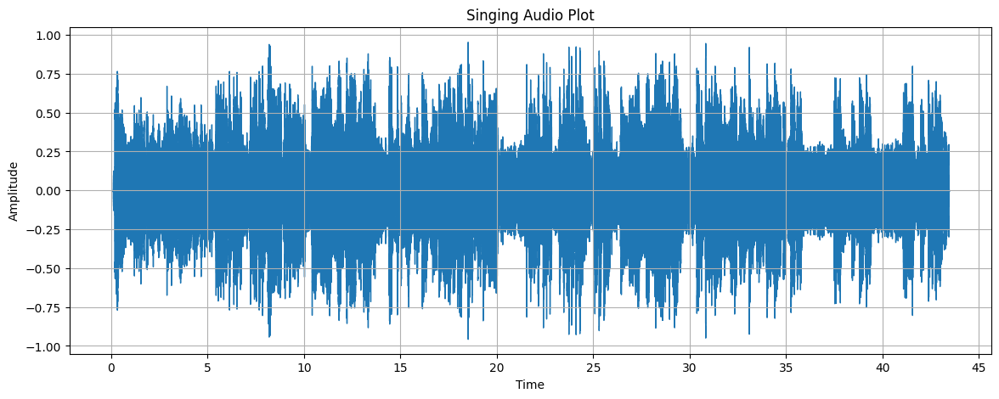

In [10]:
# Set up the figure size for the plot
plt.figure(figsize=(14, 5))
# Enable grid for the plot for better readability
plt.grid()

# Load the the audio file
x, sr = librosa.load('/kaggle/input/singing2/mp3_folder/Pickleball/Happickleball (Pickleball X Happy New Year) - NHC TT 2025.mp3')
# Display the waveform of the loaded audio file using librosa's display function
librosa.display.waveshow(x, sr=sr)
# Set the title for the plot 
plt.title("Singing Audio Plot")
# Label the y-axis as 'Amplitude' to indicate the amplitude of the audio signal
plt.ylabel("Amplitude")
Audio('/kaggle/input/singing2/mp3_folder/Pickleball/Happickleball (Pickleball X Happy New Year) - NHC TT 2025.mp3')

In [11]:
sr

22050

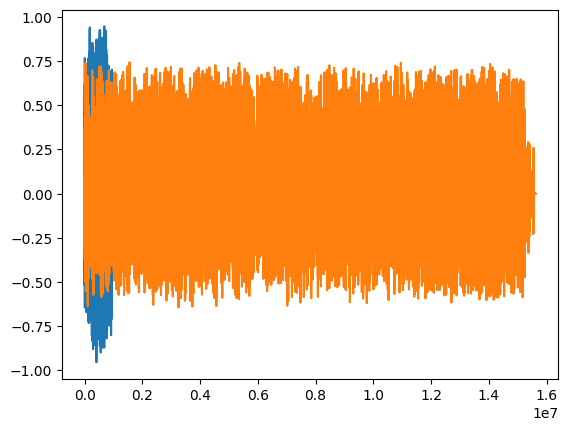

In [12]:
plt.plot(x)
plt.plot(data)
plt.show()

Spectogram Example

In [13]:
D = librosa.stft(x)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
S_db.shape

(1025, 1873)

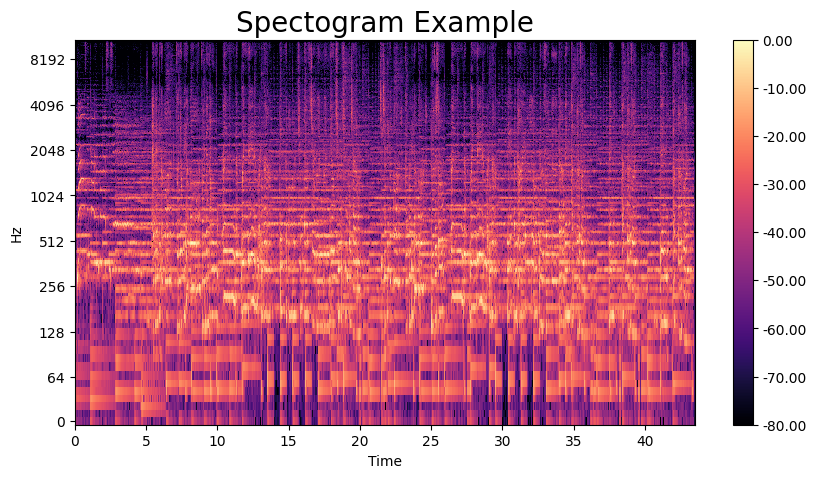

In [14]:
# Plot the transformed audio data
fig, ax = plt.subplots(figsize=(10, 5))
img = librosa.display.specshow(S_db,
                              x_axis='time',
                              y_axis='log',
                              ax=ax)
ax.set_title('Spectogram Example', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f')
plt.show()

Mel Spectogram Example

In [15]:
S = librosa.feature.melspectrogram(y=x,
                                   sr=sr,
                                   n_mels=128 * 2,)
S_db_mel = librosa.amplitude_to_db(S, ref=np.max)

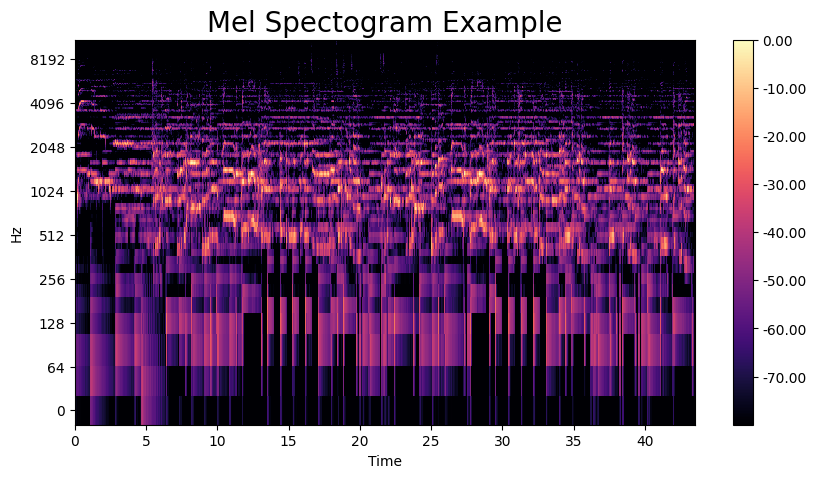

In [16]:
fig, ax = plt.subplots(figsize=(10, 5))
# Plot the mel spectogram
img = librosa.display.specshow(S_db_mel,
                              x_axis='time',
                              y_axis='log',
                              ax=ax)
ax.set_title('Mel Spectogram Example', fontsize=20)
fig.colorbar(img, ax=ax, format=f'%0.2f')
plt.show()

In [17]:
# Initialize lists to store the absolute paths of vocal samples and their corresponding labels
vocals = []
target = []

# Walk through the directory tree for 'Singer' vocal samples and collect file paths
for root, dirs, files in os.walk("/kaggle/input/singer-vs-rapper/Samples/Singer", topdown=False):
     for name in files:
        # Exclude system files like '.DS_Store' and the 'accompaniment.wav'
        if name != '.DS_Store' and name != 'accompaniment.wav':
            # Form the absolute path and append it to the 'vocals' list
            abs_path = os.path.join(root, name)
            vocals.append(abs_path)
            # Append the label 'Singer' to the 'target' list
            target.append('Singing')



# Create a pandas DataFrame with the collected vocal sample paths and their labels
df_samples = pd.DataFrame({'Path': vocals, 'Target': target})

# Display the DataFrame to verify its contents
df_samples

,Path,Target
0,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing
1,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing
2,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing
3,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing
4,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing
...,...,...
145,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing
146,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing
147,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing
148,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing


In [18]:
df_samples = pd.concat([df_samples, talking_df], axis=0)
df_samples = pd.concat([df_samples, ravdess_song_audio], axis=0)
df_samples = pd.concat([df_samples, Triet_data_audio], axis=0)
df_samples = pd.concat([df_samples, speaker_talk_df], axis=0)
df_samples


,Path,Target
0,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing
1,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing
2,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing
3,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing
4,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing
...,...,...
2676,/kaggle/input/ted-talks-audio/AUDIO/1690.mp3,Talking
2677,/kaggle/input/ted-talks-audio/AUDIO/27750.mp3,Talking
2678,/kaggle/input/ted-talks-audio/AUDIO/11.mp3,Talking
2679,/kaggle/input/ted-talks-audio/AUDIO/2593.mp3,Talking


# Extract features and scale 

In [19]:
def feature_extractor(file):
    """
    Extract features from an audio file (MFCC, Chroma, Spectral Contrast, Zero-Crossing Rate, Spectral Rolloff).
    
    Args:
    - file (str): The path to the audio file.
    
    Returns:
    - np.array: Extracted feature vector combining MFCC, Chroma, Spectral Contrast, Zero-Crossing Rate, and Spectral Rolloff.
    """
    try:
        # Load the audio file
        audio, sr = librosa.load(file)
        
        # Extract MFCC features
        mfccs = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=60)
        mfccs_mean = np.mean(mfccs.T, axis=0)

        # Extract Chroma features
        chroma = librosa.feature.chroma_stft(y=audio, sr=sr)
        chroma_mean = np.mean(chroma.T, axis=0)
        
        # Extract Spectral Contrast features
        spectral_contrast = librosa.feature.spectral_contrast(y=audio, sr=sr)
        spectral_contrast_mean = np.mean(spectral_contrast.T, axis=0)
        
        # Extract Zero-Crossing Rate
        zcr = librosa.feature.zero_crossing_rate(y=audio)
        zcr_mean = np.mean(zcr.T, axis=0)
        
        # Extract Spectral Rolloff (use default rolloff of 0.85)
        spectral_rolloff = librosa.feature.spectral_rolloff(y=audio, sr=sr)
        spectral_rolloff_mean = np.mean(spectral_rolloff.T, axis=0)
        
        # Combine all features into a single feature vector
        features = np.hstack((mfccs_mean, chroma_mean, spectral_contrast_mean, zcr_mean, spectral_rolloff_mean))
        
        return features

    except Exception as e:
        print(f"Error processing {file}: {e}")
        return None

# Batch Extractor (input list of all absolute paths of audio files)
def batch_extractor(input_list):
    """
    Extract features from a list of audio files and return the features.
    
    Args:
    - input_list (list): List of file paths for the audio files.
    
    Returns:
    - list: List containing extracted feature vectors for each file.
    """
    extracted_features = []
    
    for file_path in tqdm(input_list, desc="Extracting features from audio files"):
        features = feature_extractor(file_path)  # Extract features for each file
        if features is not None:  # Ensure features are valid before appending
            extracted_features.append(features)  # Append the extracted features
    
    return extracted_features

# Extract features from all files in df_samples
extracted_features = batch_extractor(df_samples.Path)

# Convert the extracted features into a DataFrame
feature_df = pd.DataFrame(extracted_features)

print(f"Feature DataFrame shape: {feature_df.shape}")


Extracting features from audio files: 100%|██████████| 5302/5302 [5:08:14<00:00,  3.49s/it]

Feature DataFrame shape: (5302, 81)




### 1. **MFCC (Mel-frequency Cepstral Coefficients)**:
   - **What it is**: MFCCs represent the short-term power spectrum of an audio signal. They are derived from the Mel scale, which mimics the human ear's perception of sound frequencies. The Mel scale compresses higher frequencies while maintaining the resolution of lower frequencies.
   - **How it works**: The audio signal is first transformed into a spectrogram using short-time Fourier transform (STFT), and then the Mel scale is applied. The result is a set of coefficients that capture the timbral texture of sound.
   - **Why it's used**: MFCCs are widely used in speech and music analysis because they efficiently represent the characteristics of the human voice and other sounds, making them useful for classification tasks.
   - **Output**: In this case, the code extracts 40 MFCCs and computes their mean value across time, resulting in 40 features that represent the overall spectral shape.

### 2. **Mel Spectrogram (Log Mel)**:
   - **What it is**: A Mel spectrogram represents the audio signal on the Mel scale (similar to MFCCs), but instead of just using coefficients, it displays the energy distribution over a series of time frames in a 2D matrix. The Mel spectrogram is often used in deep learning models for audio classification, as it captures both spectral and temporal information.
   - **How it works**: The audio signal is passed through a set of filters spaced according to the Mel scale. The resulting output is a matrix that captures the energy of each frequency band over time. The values are then converted into a logarithmic scale to compress the dynamic range.
   - **Why it's used**: Mel spectrograms are used to capture the spectral content of an audio signal in a way that is perceptually relevant to humans, making them a strong feature for tasks like speech recognition, music genre classification, and environmental sound classification.
   - **Output**: The Mel spectrogram is stored in a 3D array (`mel_log_3d`) and can be used for further analysis or fed into deep learning models.

### 3. **Chroma Features**:
   - **What it is**: Chroma features describe the energy distribution of audio in terms of the 12 pitch classes (corresponding to the notes in the Western musical scale). It captures harmonic and melodic content in music.
   - **How it works**: Chroma features are computed by analyzing the spectral content of the audio signal and mapping the energy to one of the 12 pitch classes (such as C, C#, D, etc.). This is done by applying a chromagram that transforms the frequency information into pitch class distributions.
   - **Why it's used**: Chroma features are commonly used in music analysis and are effective in capturing harmony and melody. They're often used for tasks like music genre classification, key detection, and chord recognition.
   - **Output**: The code computes the mean of the chroma features across time, resulting in 12 features that represent the distribution of energy across the 12 pitch classes.

### 4. **Spectral Features**:
   These features describe various characteristics of the frequency spectrum of the audio signal.

   - **Spectral Centroid**:
     - **What it is**: The spectral centroid represents the "center of mass" of the spectral distribution. It indicates where most of the energy is concentrated in the frequency spectrum, often associated with the perceived brightness of the sound.
     - **Why it's used**: It helps differentiate between bright (high-frequency) and dark (low-frequency) sounds.
     - **Output**: The code computes both the mean and standard deviation of the spectral centroid over time, providing 2 features in total.
   
   - **Spectral Bandwidth**:
     - **What it is**: Spectral bandwidth measures the width of the frequency band in which most of the signal’s energy lies. A high spectral bandwidth corresponds to a more "sharp" or "crispy" sound, while a low bandwidth suggests a more "dull" or "smooth" sound.
     - **Why it's used**: It can distinguish between sounds like a whistle (high bandwidth) and a rumbling bass (low bandwidth).
     - **Output**: The code computes both the mean and standard deviation of the spectral bandwidth over time, providing 2 features in total.

   - **Spectral Rolloff**:
     - **What it is**: Spectral rolloff is the frequency below which a certain percentage of the total spectral energy lies (often 85%). It is used to separate harmonic (musical) components from noise-like components.
     - **Why it's used**: It can help distinguish between tonal and non-tonal sounds, such as music versus speech or noise.
     - **Output**: The code computes both the mean and standard deviation of the spectral rolloff over time, providing 2 features in total.

   - **Zero Crossing Rate**:
     - **What it is**: The zero crossing rate measures how often the signal changes sign (crosses zero) over time. This is an indicator of the signal's noisiness or percussiveness.
     - **Why it's used**: It helps to distinguish between harmonic sounds (which tend to have low zero crossing rates) and percussive sounds (which have high zero crossing rates).
     - **Output**: The code computes both the mean and standard deviation of the zero crossing rate over time, providing 2 features in total.

### Summary of Feature Extraction:
- **MFCC (40 features)**: Capture the timbral texture of the sound.
- **Chroma (12 features)**: Represent harmonic and melodic content.
- **Spectral Centroid (2 features)**: Indicate the brightness of the sound.
- **Spectral Bandwidth (2 features)**: Capture the width of the frequency band.
- **Spectral Rolloff (2 features)**: Differentiate between tonal and non-tonal components.
- **Zero Crossing Rate (2 features)**: Measure the noisiness or percussiveness of the sound.

### Total Features:
- **60 features** for each audio file, which includes 40 MFCC features, 12 chroma features, and 8 spectral features (centroid, bandwidth, rolloff, and zero crossing rate).

In [20]:
# Make a new colunm called features
df_samples['features'] = extracted_features
df_samples

,Path,Target,features
0,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing,"[-184.6030731201172, 11.258545875549316, -38.6..."
1,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing,"[-166.29408264160156, 45.38043975830078, -60.5..."
2,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing,"[-252.07064819335938, 66.54825592041016, -20.3..."
3,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing,"[-180.0580291748047, -9.887465476989746, -27.8..."
4,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing,"[-124.61380767822266, 28.925277709960938, -36...."
...,...,...,...
2676,/kaggle/input/ted-talks-audio/AUDIO/1690.mp3,Talking,"[-306.4243469238281, 114.30381774902344, -9.70..."
2677,/kaggle/input/ted-talks-audio/AUDIO/27750.mp3,Talking,"[-325.95220947265625, 59.43788146972656, -8.42..."
2678,/kaggle/input/ted-talks-audio/AUDIO/11.mp3,Talking,"[-158.4081573486328, 104.29682159423828, -7.47..."
2679,/kaggle/input/ted-talks-audio/AUDIO/2593.mp3,Talking,"[-257.3618469238281, 96.41130828857422, -29.97..."


In [21]:
# Shuffling the dataset
df_samples = df_samples.sample(frac=1).reset_index(drop=True)
df_samples

,Path,Target,features
0,/kaggle/input/ravdess-emotional-speech-audio/a...,Talking,"[-594.0286254882812, 77.6082763671875, -6.5460..."
1,/kaggle/input/ted-talks-audio/AUDIO/2399.mp3,Talking,"[-266.48077392578125, 104.76864624023438, 20.8..."
2,/kaggle/input/ted-talks-audio/AUDIO/1496.mp3,Talking,"[-290.2078552246094, 96.93492126464844, -34.79..."
3,/kaggle/input/ted-talks-audio/AUDIO/2342.mp3,Talking,"[-321.597900390625, 87.45746612548828, -1.0628..."
4,/kaggle/input/singer-vs-rapper/Samples/Singer/...,Singing,"[-124.61380767822266, 28.925277709960938, -36...."
...,...,...,...
5297,/kaggle/input/ravdess-emotional-speech-audio/a...,Talking,"[-614.2962646484375, 63.116600036621094, -6.80..."
5298,/kaggle/input/ravdess-emotional-speech-audio/a...,Talking,"[-432.04620361328125, 6.456398963928223, -3.99..."
5299,/kaggle/input/ravdess-emotional-speech-audio/a...,Talking,"[-544.1214599609375, 46.69984817504883, -21.97..."
5300,/kaggle/input/ravdess-emotional-speech-audio/a...,Talking,"[-430.6190490722656, 43.36703872680664, -4.660..."


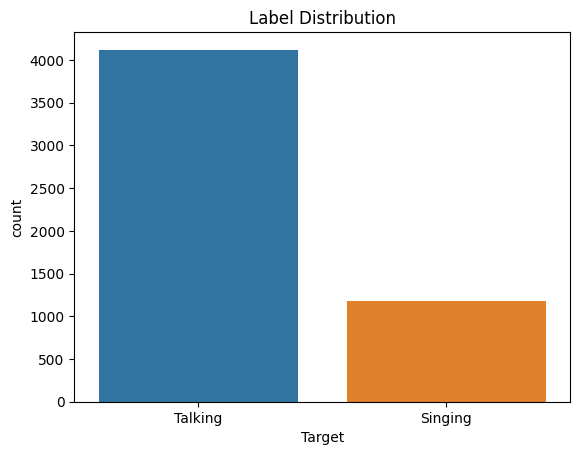

In [22]:
sns.countplot(x='Target', data=df_samples)
plt.title("Label Distribution")
plt.show()


In [23]:
# Replace the categorical 'Target' labels in the dataframe with numerical labels
df_samples['Target'] = df_samples['Target'].replace({'Singing': 1, 'Talking': 0})

# Convert the 'features' column in the dataframe to a numpy array for model input
# The 'tolist()' method is used to convert the column to a list before array conversion
X = np.array(df_samples['features'].tolist())

# Convert the 'Target' column in the dataframe to a numpy array for the output labels
y = np.array(df_samples['Target'].tolist())

# Display the array 'y' to verify the conversion of labels
y

/tmp/ipykernel_23/738167498.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_samples['Target'] = df_samples['Target'].replace({'Singing': 1, 'Talking': 0})


array([0, 0, 0, ..., 0, 0, 0])

In [24]:
#print the x and y array shape
print(X.shape)
print(y.shape)

(5302, 81)
(5302,)


In [25]:

# First split the data into training+validation and test sets
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Now split the training+validation set into separate training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, random_state=42)  # 0.25 x 0.8 = 0.2

# Print the shapes of the splits
print("Training set shape:", X_train.shape, y_train.shape)
print("Validation set shape:", X_val.shape, y_val.shape)
print("Test set shape:", X_test.shape, y_test.shape)

Training set shape: (3180, 81) (3180,)
Validation set shape: (1061, 81) (1061,)
Test set shape: (1061, 81) (1061,)


# Training Models

In [26]:
model = Sequential()

#### First layer stack
model.add(Dense(100, input_shape=(X_train.shape[1],)))
model.add(Activation('relu'))
model.add(Dropout(0.5))


#### Second layer stack
model.add(Dense(200))
model.add(Activation('relu'))
model.add(Dropout(0.5))


#### Third layer stack
model.add(Dense(200))
model.add(Activation('relu'))
model.add(Dropout(0.5))


### Final Layer
model.add(Dense(1))
model.add(Activation("sigmoid"))

model.summary()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 100)            │         8,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 200)            │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 200)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 200)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 200)            │        40,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 200)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 200)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           201 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 1)              │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 68,801 (268.75 KB)

 Trainable params: 68,801 (268.75 KB)

 Non-trainable params: 0 (0.00 B)

In [27]:
METRICS =  [
    'accuracy',
    tf.keras.metrics.Precision(name='precision'),
    tf.keras.metrics.Recall(name='recall')
]


In [28]:
from keras.optimizers import Adam
from keras.losses import BinaryCrossentropy

saved_callbacks = ModelCheckpoint('./saved_models/bestmodel.keras',
                                  save_weights_only=False, 
                                  monitor='loss', 
                                  save_best_only=True)

### Compile and Fit Model 
model.compile(optimizer=Adam(),
              loss=BinaryCrossentropy(),
              metrics=METRICS)

history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_val, y_val))

Epoch 1/50


I0000 00:00:1734349382.182559      85 service.cc:145] XLA service 0x7a7af00058a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1734349382.182613      85 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


 98/100 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6517 - loss: 111.1004 - precision: 0.2533 - recall: 0.2829

I0000 00:00:1734349386.909130      85 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step - accuracy: 0.6516 - loss: 110.0972 - precision: 0.2525 - recall: 0.2820 - val_accuracy: 0.7710 - val_loss: 1.9203 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6333 - loss: 32.1057 - precision: 0.2249 - recall: 0.2710 - val_accuracy: 0.7710 - val_loss: 3.2177 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6423 - loss: 15.1326 - precision: 0.2109 - recall: 0.2186 - val_accuracy: 0.7710 - val_loss: 1.3901 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6395 - loss: 8.2829 - precision: 0.2035 - recall: 0.2265 - val_accuracy: 0.7710 - val_loss: 0.8475 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6420 - loss: 4.9620 - precision: 0.2240 - recall: 0.2605 - val_accu

In [29]:
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout

model2 = Sequential()
model2.add(Conv1D(64, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1)))  # 1D audio signal, e.g., 16000 samples
model2.add(MaxPooling1D(pool_size=2))
model2.add(Conv1D(128, kernel_size=3, activation='relu'))
model2.add(MaxPooling1D(pool_size=2))
model2.add(Flatten())
model2.add(Dense(128, activation='relu'))
model2.add(Dropout(0.5))
model2.add(Dense(1, activation='sigmoid')) 


### Compile and Fit Model 
model2.compile(optimizer=Adam(),
              loss=BinaryCrossentropy(),
              metrics=METRICS)

history2 = model2.fit(X_train, y_train, epochs=50, batch_size=32
                    , validation_data=(X_val, y_val))


Epoch 1/50


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


100/100 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - accuracy: 0.9030 - loss: 0.3427 - precision: 0.8963 - recall: 0.8960 - val_accuracy: 0.9887 - val_loss: 0.0271 - val_precision: 0.9793 - val_recall: 0.9712
Epoch 2/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9793 - loss: 0.0654 - precision: 0.9675 - recall: 0.9377 - val_accuracy: 0.9896 - val_loss: 0.0215 - val_precision: 0.9754 - val_recall: 0.9794
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9910 - loss: 0.0458 - precision: 0.9874 - recall: 0.9695 - val_accuracy: 0.9821 - val_loss: 0.0475 - val_precision: 1.0000 - val_recall: 0.9218
Epoch 4/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9879 - loss: 0.0424 - precision: 0.9867 - recall: 0.9581 - val_accuracy: 0.9915 - val_loss: 0.0244 - val_precision: 0.9756 - val_recall: 0.9877
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9917 - loss: 0.0361 - precision: 0.9831 - recall: 0.9787 - val_accuracy: 0.9868 - val_loss: 0.0362 - val

In [30]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, BatchNormalization, Conv1D, MaxPooling1D, LSTM, Bidirectional, Flatten

model3 = Sequential()

# Reshaped input: (timesteps, features)
input_shape = (X_train.shape[1], 1)

#### Convolutional layers for feature extraction
model3.add(Conv1D(64, kernel_size=3, activation='relu', input_shape=input_shape))
model3.add(BatchNormalization())
model3.add(MaxPooling1D(pool_size=2))
model3.add(Dropout(0.3))

model3.add(Conv1D(128, kernel_size=3, activation='relu'))
model3.add(BatchNormalization())
model3.add(MaxPooling1D(pool_size=2))
model3.add(Dropout(0.3))

#### Recurrent layers for temporal modeling
model3.add(Bidirectional(LSTM(128, return_sequences=True)))
model3.add(Dropout(0.4))
model3.add(Bidirectional(LSTM(64)))

#### Fully connected layers for classification
model3.add(Dense(256, activation='relu'))
model3.add(BatchNormalization())
model3.add(Dropout(0.5))

model3.add(Dense(128, activation='relu'))
model3.add(BatchNormalization())
model3.add(Dropout(0.5))

#### Output layer for binary classification
model3.add(Dense(1, activation='sigmoid'))

model3.summary()


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_2 (Conv1D)               │ (None, 79, 64)         │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 79, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_2 (MaxPooling1D)  │ (None, 39, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 39, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_3 (Conv1D)               │ (None, 37, 128)        │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 37, 128)        │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_3 (MaxPooling1D)  │ (None, 18, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 18, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 18, 256)        │       263,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 18, 256)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (None, 128)            │       164,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 520,833 (1.99 MB)

 Trainable params: 519,681 (1.98 MB)

 Non-trainable params: 1,152 (4.50 KB)

In [31]:
### Compile and Fit Model 
model3.compile(optimizer=Adam(),
              loss=BinaryCrossentropy(),
              metrics=METRICS)

history3 = model3.fit(X_train, y_train, epochs=50, batch_size=32,
                    callbacks=[saved_callbacks], validation_data=(X_val, y_val))

Epoch 1/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - accuracy: 0.7851 - loss: 0.5189 - precision: 0.7228 - recall: 0.9023 - val_accuracy: 0.9557 - val_loss: 0.2556 - val_precision: 0.8551 - val_recall: 0.9712
Epoch 2/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9475 - loss: 0.1881 - precision: 0.8808 - recall: 0.8714 - val_accuracy: 0.9698 - val_loss: 0.1117 - val_precision: 0.9774 - val_recall: 0.8889
Epoch 3/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9564 - loss: 0.1213 - precision: 0.9057 - recall: 0.8826 - val_accuracy: 0.9312 - val_loss: 0.1771 - val_precision: 1.0000 - val_recall: 0.6996
Epoch 4/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9612 - loss: 0.1139 - precision: 0.9291 - recall: 0.9006 - val_accuracy: 0.9576 - val_loss: 0.1158 - val_precision: 0.9950 - val_recall: 0.8189
Epoch 5/50
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9619 - loss: 0.1366 - precision: 0.9221 - recall: 0.9060 - val_accuracy: 0.9189 - val_lo

# Model Evaluation

In [32]:
def plot_training_history(history):
    plt.figure(figsize=(20, 10))

    # Plot Accuracy
    plt.subplot(2, 4, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.ylim([0, 1.1])
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.title('Training and Validation Accuracy')

    # Plot Loss
    plt.subplot(2, 4, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper right')
    plt.grid(True)
    plt.title('Training and Validation Loss')

    # Plot Precision
    plt.subplot(2, 4, 3)
    plt.plot(history.history['precision'], label='Train Precision')
    plt.plot(history.history['val_precision'], label='Validation Precision')
    plt.xlabel('Epoch')
    plt.ylabel('Precision')
    plt.ylim([0, 1.1])
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.title('Training and Validation Precision')

    # Plot Recall
    plt.subplot(2, 4, 4)
    plt.plot(history.history['recall'], label='Train Recall')
    plt.plot(history.history['val_recall'], label='Validation Recall')
    plt.xlabel('Epoch')
    plt.ylabel('Recall')
    plt.ylim([0, 1.1])
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.title('Training and Validation Recall')

    plt.tight_layout()
    plt.show()

In [33]:
def f1_score(precision, recall):
    if precision + recall == 0:  
        return 0  
    return 2 * ((precision * recall) / (precision + recall))

def calculate_map(y_true, y_scores, start_threshold=0.5, end_threshold=0.95, num_thresholds=10):
    """
    Calculates mAP for binary classification over a range of thresholds.

    Parameters:
    - y_true: True binary labels.
    - y_scores: Predicted scores (probabilities).
    - start_threshold: Starting threshold value (e.g., 0.5).
    - end_threshold: Ending threshold value (e.g., 0.95).
    - num_thresholds: Number of thresholds to use in calculation.

    Returns:
    - mAP: Mean Average Precision over specified thresholds.
    """
    thresholds = np.linspace(start_threshold, end_threshold, num_thresholds)
    mAP = np.mean([average_precision_score(y_true, (y_scores >= t).astype(int)) for t in thresholds])
    return mAP

def rmsd(y_true, y_pred):
    return np.sqrt(np.mean((y_true - y_pred) ** 2))



In [34]:
def evaluate_and__model(model, history, X_val, y_val):
    # Plot training history
    plot_training_history(history)

    print('=' * 100)

    # Evaluate the model on the validation set
    test_loss, test_accuracy, test_precision, test_recall= model.evaluate(X_val, y_val)
    print(f"-Test Loss: {test_loss:.4f}")
    print(f"-Test Accuracy: {test_accuracy:.4f}")
    print(f"-Test Precision: {test_precision:.4f}")
    print(f"-Test Recall: {test_recall:.4f}")

    # Predict on validation data for additional metrics
    y_pred = model.predict(X_val).flatten()
    y_true = y_val

    # Convert predictions to binary (0 or 1)
    y_pred_binary = (y_pred > 0.5).astype(int)

    # Calculate F1 Score
    f1 = f1_score(test_precision, test_recall)
    print(f"-Test F1 Score: {f1:.4f}")

    # Calculate mAP@0.50
    map50 = calculate_map(y_true, y_pred, start_threshold=0.5, end_threshold=0.5, num_thresholds=1)
    print(f"-Test Mean Average Precision (mAP@0.50): {map50:.4f}")

    # Calculate mAP@0.50:0.95
    map50_95 = calculate_map(y_true, y_pred, start_threshold=0.5, end_threshold=0.95, num_thresholds=10)
    print(f"-Test Mean Average Precision (mAP@0.50-0.95): {map50_95:.4f}")

 
    
    print('/'*100)
    print(classification_report(y_pred_binary, y_true))
    print('/'*100)

    print(y_pred_binary)
    print('/'*100)

    conf_matrix = confusion_matrix(y_true, y_pred_binary)
    sns.heatmap(conf_matrix, linecolor='white', cmap='Blues', linewidth=1, annot=True, fmt='')
    
    plt.title('Confusion Matrix', size=20)
    plt.xlabel('Predicted Labels', size=14)
    plt.ylabel('Actual Labels', size=14)
    plt.show()

    print('=' * 100)

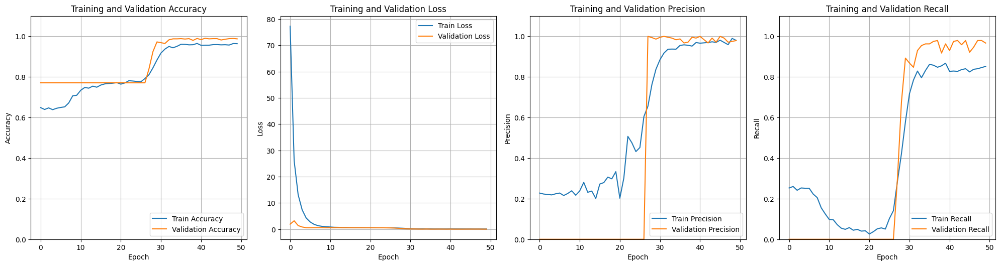

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9845 - loss: 0.0525 - precision: 0.9639 - recall: 0.9728 
-Test Loss: 0.0463
-Test Accuracy: 0.9868
-Test Precision: 0.9672
-Test Recall: 0.9752
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
-Test F1 Score: 0.9712
-Test Mean Average Precision (mAP@0.50): 0.9489
-Test Mean Average Precision (mAP@0.50-0.95): 0.9514
////////////////////////////////////////////////////////////////////////////////////////////////////
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       817
           1       0.98      0.97      0.97       244

    accuracy                           0.99      1061
   macro avg       0.98      0.98      0.98      1061
weighted avg       0.99      0.99      0.99      1061

////////////////////////////////////////////////////////////////////////////////////////////////////
[0 0 1 ... 0 0 0]
////////////////////////////////////////////////////////////////////////////////////////////

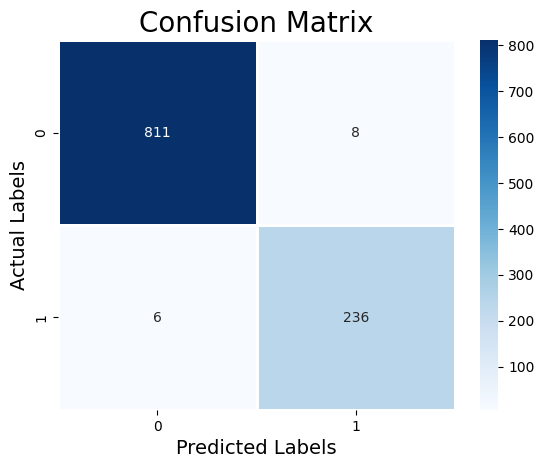

In [35]:
evaluate_and__model(model, history, X_test,y_test)

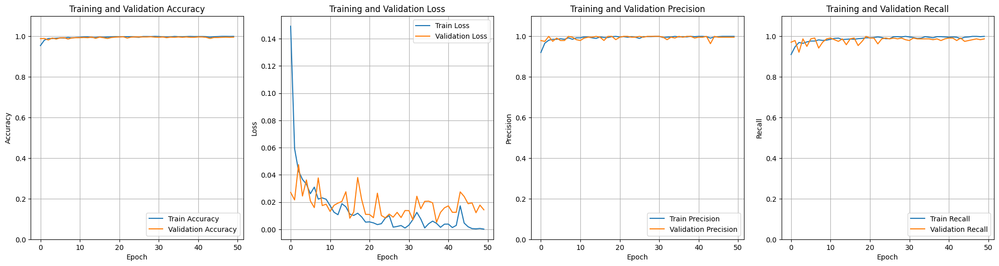

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9903 - loss: 0.0343 - precision: 0.9827 - recall: 0.9773     
-Test Loss: 0.0243
-Test Accuracy: 0.9925
-Test Precision: 0.9835
-Test Recall: 0.9835
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
-Test F1 Score: 0.9835
-Test Mean Average Precision (mAP@0.50): 0.9710
-Test Mean Average Precision (mAP@0.50-0.95): 0.9731
////////////////////////////////////////////////////////////////////////////////////////////////////
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       819
           1       0.98      0.98      0.98       242

    accuracy                           0.99      1061
   macro avg       0.99      0.99      0.99      1061
weighted avg       0.99      0.99      0.99      1061

////////////////////////////////////////////////////////////////////////////////////////////////////
[0 0 1 ... 0 0 0]
////////////////////////////////////////////////////////////////////////////////////////

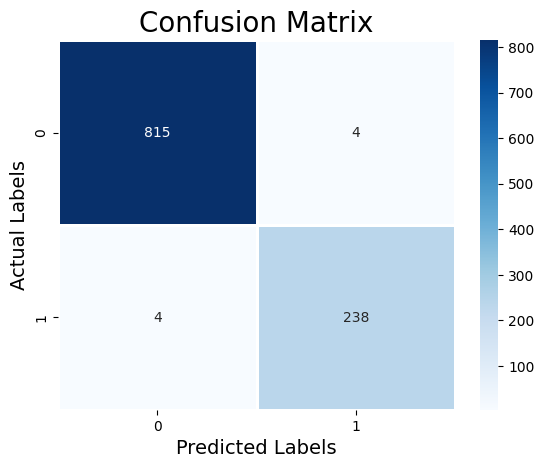

In [36]:
evaluate_and__model(model2, history2, X_test,y_test)

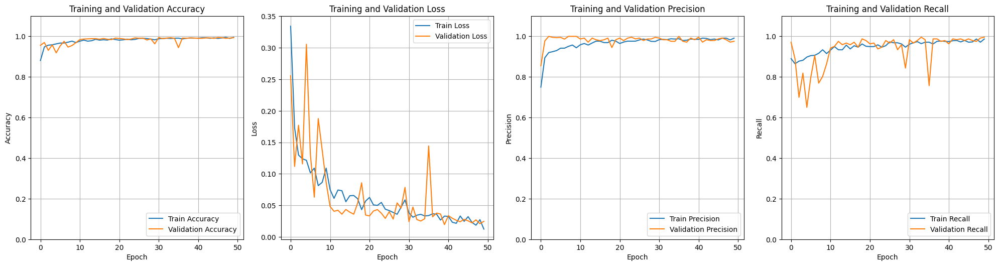

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9898 - loss: 0.0496 - precision: 0.9737 - recall: 0.9836
-Test Loss: 0.0437
-Test Accuracy: 0.9887
-Test Precision: 0.9713
-Test Recall: 0.9793
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
-Test F1 Score: 0.9753
-Test Mean Average Precision (mAP@0.50): 0.9560
-Test Mean Average Precision (mAP@0.50-0.95): 0.9596
////////////////////////////////////////////////////////////////////////////////////////////////////
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       817
           1       0.98      0.97      0.98       244

    accuracy                           0.99      1061
   macro avg       0.99      0.98      0.98      1061
weighted avg       0.99      0.99      0.99      1061

////////////////////////////////////////////////////////////////////////////////////////////////////
[0 0 1 ... 0 0 0]
////////////////////////////////////////////////////////////////////////////////////////////

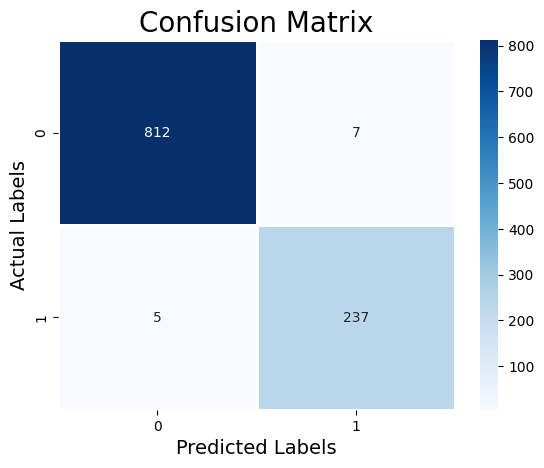

In [37]:
evaluate_and__model(model3, history3, X_test,y_test)